#Imports

In [ ]:
!pip install kaggle
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json

In [ ]:
! kaggle datasets download balraj98/horse2zebra-dataset
!unzip /content/horse2zebra-dataset.zip

100% 111M/111M [00:05<00:00, 23.8MB/s]
100% 111M/111M [00:05<00:00, 19.8MB/s]
Archive:  /content/horse2zebra-dataset.zip
  inflating: metadata.csv            
  inflating: testA/n02381460_1000.jpg  
  inflating: testA/n02381460_1010.jpg  
  inflating: testA/n02381460_1030.jpg  
  inflating: testA/n02381460_1090.jpg  
  inflating: testA/n02381460_1100.jpg  
  inflating: testA/n02381460_1110.jpg  
  inflating: testA/n02381460_1120.jpg  
  inflating: testA/n02381460_1160.jpg  
  inflating: testA/n02381460_120.jpg  
  inflating: testA/n02381460_1210.jpg  
  inflating: testA/n02381460_1260.jpg  
  inflating: testA/n02381460_1300.jpg  
  inflating: testA/n02381460_1350.jpg  
  inflating: testA/n02381460_1360.jpg  
  inflating: testA/n02381460_140.jpg  
  inflating: testA/n02381460_1420.jpg  
  inflating: testA/n02381460_1540.jpg  
  inflating: testA/n02381460_1620.jpg  
  inflating: testA/n02381460_1630.jpg  
  inflating: testA/n02381460_1660.jpg  
  inflating: testA/n02381460_1690.jpg  
  i

In [ ]:
!pip install albumentations

In [ ]:
import torch
import torch.nn as nn


from torch.utils.data import Dataset
from PIL import Image
import os
import numpy as np


from torch.utils.data import DataLoader
import torch.optim as optim
from tqdm import tqdm
from torchvision.utils import save_image

import albumentations as A
from albumentations.pytorch import ToTensorV2

import random

Config

In [ ]:
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"
BATCH_SIZE = 1
LEARNING_RATE = 0.00002

transforms = A.Compose(
    [
        A.Resize(width=256, height=256),
        A.HorizontalFlip(p=0.5),
        A.ColorJitter(p=0.1),
        A.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5], max_pixel_value=255),
        ToTensorV2(),
    ],
    additional_targets={"image0": "image"},
)

In [ ]:
class HorseZebraDataset(Dataset):
    def __init__(self, zebra, horse, transform=None):
        self.horse = horse
        self.zebra = zebra
        self.transform = transform

        self.horse_images = os.listdir(horse)
        self.zebra_images = os.listdir(zebra)
        self.dataset_length = max(len(self.horse_images), len(self.zebra_images))
        self.horse_length = len(self.horse_images)
        self.zebra_length = len(self.zebra_images)

    def __len__(self):
        return self.dataset_length

    def __getitem__(self, index):
        zebra_img = self.zebra_images[index % self.zebra_length]
        horse_img = self.horse_images[index % self.horse_length]

        horse_path = os.path.join(self.horse, horse_img)
        zebra_path = os.path.join(self.zebra, zebra_img)

        zebra_img = np.array(Image.open(zebra_path).convert("RGB"))
        horse_img = np.array(Image.open(horse_path).convert("RGB"))
        if self.transform:
            augmentations = self.transform(image=horse_img, image0=zebra_img)
            horse_img = augmentations["image"]
            zebra_img = augmentations["image0"]

        return horse_img, zebra_img

dataset = HorseZebraDataset(
    horse="/content/trainA",
    zebra="/content/trainB",
    transform=transforms,
)

loader = DataLoader(
    dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=4,
    pin_memory=True,
)
g_scaler = torch.cuda.amp.GradScaler()
d_scaler = torch.cuda.amp.GradScaler()


#Cycle GAN

In [ ]:
import torch.nn as nn

class Generator(nn.Module):
    def __init__(self, input_nc=3, output_nc=4, ngf=64, norm_layer=nn.BatchNorm2d, use_dropout=False):
        super(Generator, self).__init__()
        self.input_nc = input_nc
        self.output_nc = output_nc
        self.ngf = ngf

        model = [nn.ReflectionPad2d(3),
                 nn.Conv2d(input_nc, ngf, kernel_size=7, padding=0),
                 norm_layer(ngf),
                 nn.ReLU(True)]

        n_downsampling = 2
        for i in range(n_downsampling):
            mult = 2 ** i
            model += [nn.Conv2d(ngf * mult, ngf * mult * 2, kernel_size=3, stride=2, padding=1),
                      norm_layer(ngf * mult * 2),
                      nn.ReLU(True)]

        mult = 2 ** n_downsampling
        for _ in range(6):
            model += [nn.Conv2d(ngf * mult, ngf * mult, kernel_size=3, stride=1, padding=1),
                      norm_layer(ngf * mult),
                      nn.ReLU(True)]

        for i in range(n_downsampling):
            mult = 2 ** (n_downsampling - i)
            model += [nn.ConvTranspose2d(ngf * mult, int(ngf * mult / 2), kernel_size=3, stride=2, padding=1, output_padding=1),
                      norm_layer(int(ngf * mult / 2)),
                      nn.ReLU(True)]

        model += [nn.ReflectionPad2d(3)]
        model += [nn.Conv2d(ngf, output_nc, kernel_size=7, padding=0)]

        self.model = nn.Sequential(*model)

    def forward(self, input):
        return self.model(input)


class Discriminator(nn.Module):
    def __init__(self, input_nc=3, ndf=64, norm_layer=nn.BatchNorm2d):
        super(Discriminator, self).__init__()
        self.conv_tower = nn.Sequential(
            nn.Conv2d(input_nc, ndf, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf, ndf * 2, kernel_size=4, stride=2, padding=1),
            norm_layer(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 2, ndf * 4, kernel_size=4, stride=2, padding=1),
            norm_layer(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 4, ndf * 8, kernel_size=4, stride=2, padding=1),
            norm_layer(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 8, 1, kernel_size=4, stride=1, padding=0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, img):
        output = self.conv_tower(img)
        return output


In [ ]:
import matplotlib.pyplot as plt
import torchvision.transforms.functional as TF

h_disc = Discriminator().to(DEVICE)
z_disc = Discriminator().to(DEVICE)
h_gen = Generator(input_nc=3, output_nc=3).to(DEVICE)
z_gen = Generator(input_nc=3, output_nc=3).to(DEVICE)

opt_disc = optim.Adam(
    list(h_disc.parameters()) + list(z_disc.parameters()),
    lr=LEARNING_RATE,
    betas=(0.5, 0.999),
)

opt_gen = optim.Adam(
    list(z_gen.parameters()) + list(h_gen.parameters()),
    lr=LEARNING_RATE,
    betas=(0.5, 0.999),
)

L1 = nn.L1Loss()
mse = nn.MSELoss()

Training

In [ ]:
save_count = 0

def train_fn(h_disc, z_disc, h_gen, z_gen, loader, disc_opt, gen_opt, l1,
            mse, d_scaler, g_scaler, output_dir):
    global save_count
    loop = tqdm(loader, leave=True)

    fake_horses = 0
    real_horses = 0

    for idx, (horse, zebra) in enumerate(loop):
        horse = horse.to(DEVICE)
        zebra = zebra.to(DEVICE)

        with torch.cuda.amp.autocast():
            fake_horse = h_gen(zebra)
            real_horse_disc = h_disc(horse)
            fake_horse_disc = h_disc(fake_horse.detach())
            real_horses += real_horse_disc.mean().item()
            fake_horses += fake_horse_disc.mean().item()

            real_horse_disc_loss = mse(real_horse_disc, torch.ones_like(real_horse_disc))
            fake_horse_disc_loss = mse(fake_horse_disc, torch.zeros_like(fake_horse_disc))
            horse_disc_loss = real_horse_disc_loss + fake_horse_disc_loss
            fake_zebra = z_gen(horse)
            real_zebra_disc = z_disc(zebra)
            fake_zebra_disc = z_disc(fake_zebra.detach())

            real_zebra_disc_loss = mse(real_zebra_disc, torch.ones_like(real_zebra_disc))
            fake_zebra_disc_loss = mse(fake_zebra_disc, torch.zeros_like(fake_zebra_disc))
            zebra_disc_loss = real_zebra_disc_loss + fake_zebra_disc_loss

            disc_loss = (zebra_disc_loss + horse_disc_loss) / 2

        opt_disc.zero_grad()
        d_scaler.scale(disc_loss).backward()
        d_scaler.step(opt_disc)
        d_scaler.update()

        with torch.cuda.amp.autocast():
            fake_horse_disc = h_disc(fake_horse)
            fake_zebra_disc = z_disc(fake_zebra)
            horse_gen_loss = mse(fake_horse_disc, torch.ones_like(fake_horse_disc))
            zebra_gen_loss = mse(fake_zebra_disc, torch.ones_like(fake_zebra_disc))

            gen_loss = (
                horse_gen_loss + zebra_gen_loss
                + (l1(zebra, z_gen(fake_horse)) * 10)
                + (l1(horse, h_gen(fake_zebra)) * 10)
            )

        opt_gen.zero_grad()
        g_scaler.scale(gen_loss).backward()
        g_scaler.step(opt_gen)
        g_scaler.update()

        if idx % 500 == 0:
            horse_dir = os.path.join(output_dir, "horse_gen")
            zebra_dir = os.path.join(output_dir, "zebra_gen")
            os.makedirs(horse_dir, exist_ok=True)
            os.makedirs(zebra_dir, exist_ok=True)
            save_image(fake_horse * 0.5 + 0.5, f"{horse_dir}/horse_{epoch}_{idx}.png")
            save_image(fake_zebra * 0.5 + 0.5, f"{zebra_dir}/zebra_{epoch}_{idx}.png")

        loop.set_postfix(real_horse=real_horses / (idx + 1), fake_horse=fake_horses / (idx + 1))

output_dir = "output_images"
for epoch in range(4):
    train_fn(h_disc, z_disc, z_gen, h_gen, loader, opt_disc, opt_gen, L1, mse, d_scaler, g_scaler, output_dir)

100%|██████████| 1334/1334 [02:38<00:00,  8.40it/s, fake_horse=0.00553, real_horse=0.996]


OUTPUT FOR CYCLE GAN

Outputting images in output_images/horse_gen:
Displaying image: horse_2_0.png


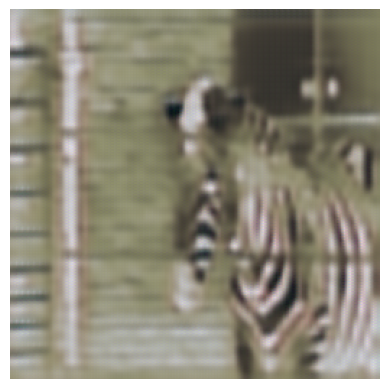

Displaying image: horse_2_500.png


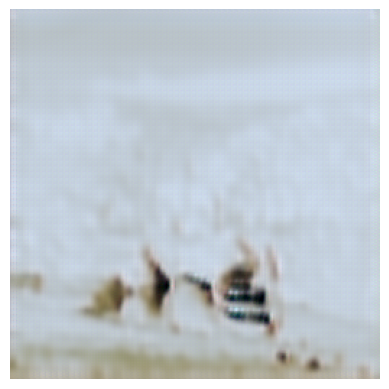

Displaying image: horse_0_0.png


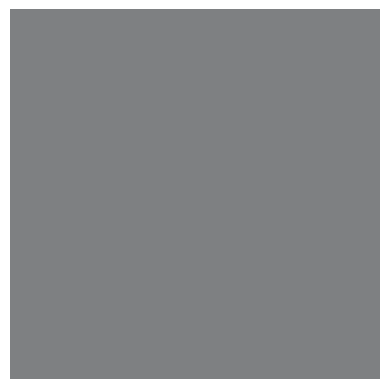

Displaying image: horse_2_1000.png


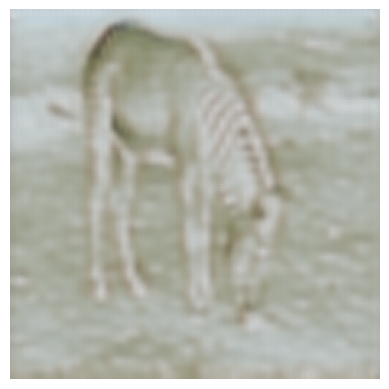

Displaying image: horse_0_500.png


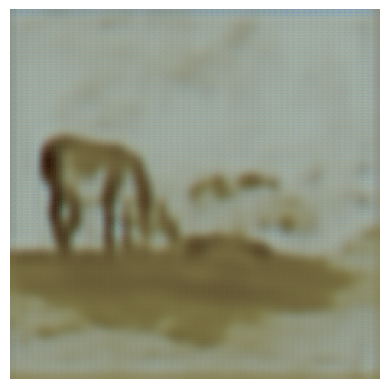

Displaying image: horse_3_1000.png


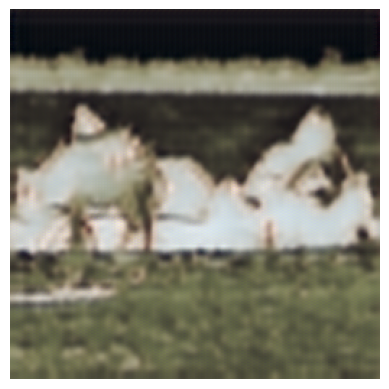

Displaying image: horse_1_0.png


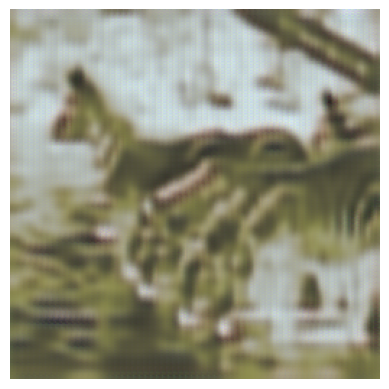

Displaying image: horse_3_500.png


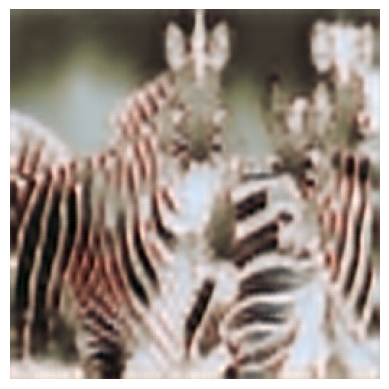

Displaying image: horse_0_1000.png


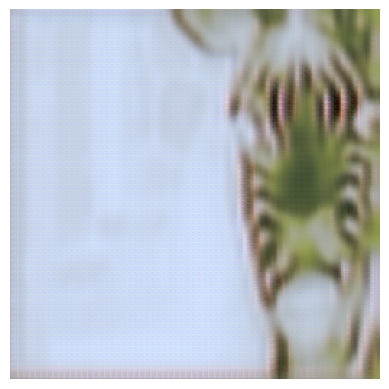

Displaying image: horse_1_500.png


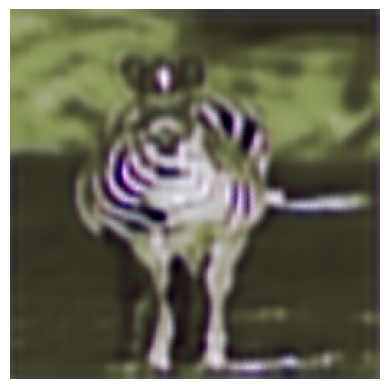

Displaying image: horse_3_0.png


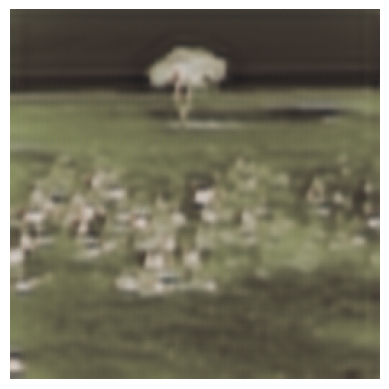

Displaying image: horse_1_1000.png


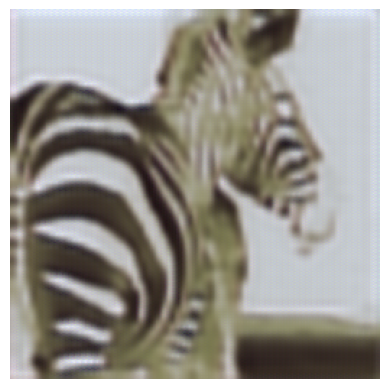

Outputting images in output_images/zebra_gen:
Displaying image: zebra_1_0.png


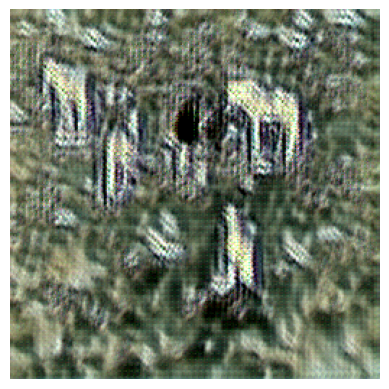

Displaying image: zebra_2_0.png


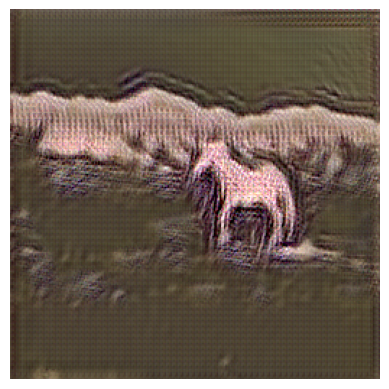

Displaying image: zebra_1_1000.png


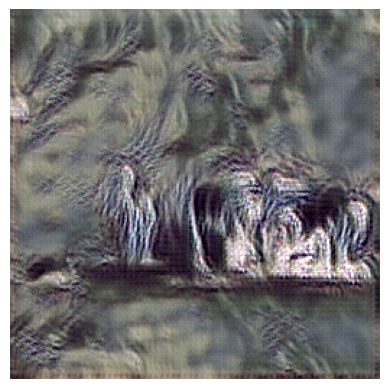

Displaying image: zebra_3_0.png


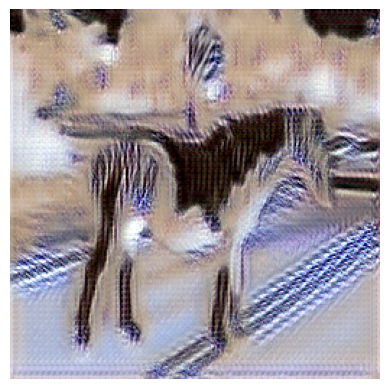

Displaying image: zebra_3_1000.png


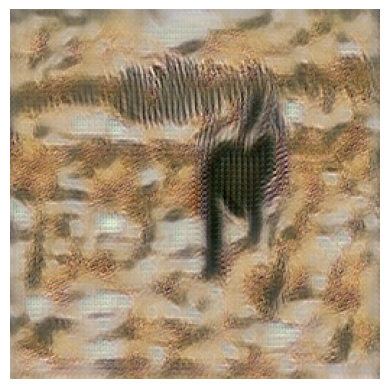

Displaying image: zebra_2_1000.png


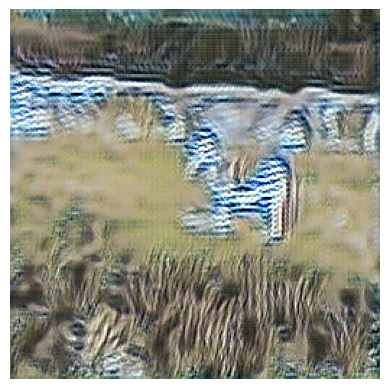

Displaying image: zebra_0_500.png


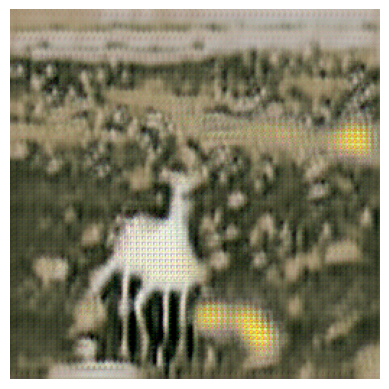

Displaying image: zebra_0_0.png


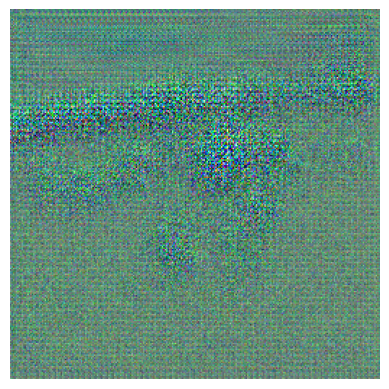

Displaying image: zebra_1_500.png


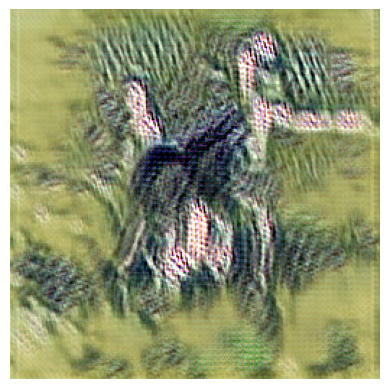

Displaying image: zebra_0_1000.png


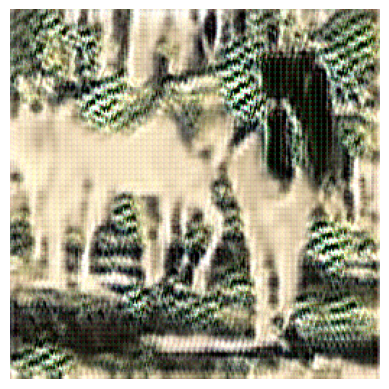

Displaying image: zebra_3_500.png


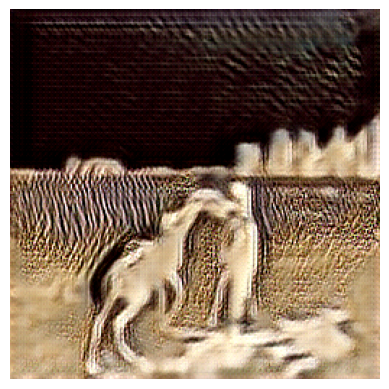

Displaying image: zebra_2_500.png


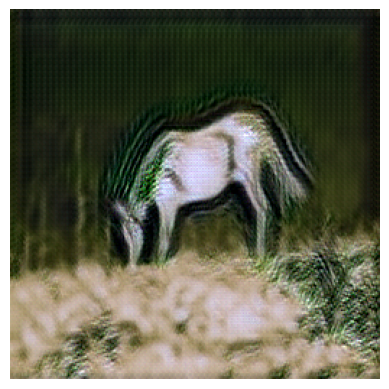

In [ ]:
import os
import matplotlib.pyplot as plt
from PIL import Image

def display_images(directory):
    print(f"Outputting images in {directory}:")
    files = os.listdir(directory)
    for file_name in files:
        file_path = os.path.join(directory, file_name)
        print(f"Displaying image: {file_name}")
        img = Image.open(file_path)
        plt.imshow(img)
        plt.axis('off')
        plt.show()

display_images("output_images/horse_gen")
display_images("output_images/zebra_gen")


#Attention mechanisms into the generator and discriminator network

In [ ]:
import torch.nn as nn

class SelfAttention(nn.Module):
    def __init__(self, in_dim):
        super(SelfAttention, self).__init__()

        self.query_conv = nn.Conv2d(in_channels=in_dim, out_channels=in_dim // 8, kernel_size=1)
        self.key_conv = nn.Conv2d(in_channels=in_dim, out_channels=in_dim // 8, kernel_size=1)
        self.value_conv = nn.Conv2d(in_channels=in_dim, out_channels=in_dim, kernel_size=1)
        self.gamma = nn.Parameter(torch.zeros(1))
        self.softmax = nn.Softmax(dim=-1)

    def forward(self, x):
        batch_size, channels, height, width = x.size()
        proj_query = self.query_conv(x).view(batch_size, -1, width * height).permute(0, 2, 1)
        proj_key = self.key_conv(x).view(batch_size, -1, width * height)
        energy = torch.bmm(proj_query, proj_key)
        attention = self.softmax(energy)
        proj_value = self.value_conv(x).view(batch_size, -1, width * height)
        out = torch.bmm(proj_value, attention.permute(0, 2, 1))
        out = out.view(batch_size, channels, height, width)
        out = self.gamma * out + x
        return out

In [ ]:

class Generator(nn.Module):
    def __init__(self, input_nc=3, output_nc=4, ngf=64, norm_layer=nn.BatchNorm2d, use_dropout=False):
        super(Generator, self).__init__()
        self.input_nc = input_nc
        self.output_nc = output_nc
        self.ngf = ngf

        model = [nn.ReflectionPad2d(3),
                 nn.Conv2d(input_nc, ngf, kernel_size=7, padding=0),
                 norm_layer(ngf),
                 nn.ReLU(True)]

        n_downsampling = 2
        for i in range(n_downsampling):
            mult = 2 ** i
            model += [nn.Conv2d(ngf * mult, ngf * mult * 2, kernel_size=3,
                                stride=2, padding=1),
                      norm_layer(ngf * mult * 2),
                      nn.ReLU(True)]

        mult = 2 ** n_downsampling
        for _ in range(6):
            model += [nn.Conv2d(ngf * mult, ngf * mult, kernel_size=3,
                                stride=1, padding=1),
                      norm_layer(ngf * mult),
                      nn.ReLU(True)]

        model += [SelfAttention(ngf * mult)]

        for i in range(n_downsampling):
            mult = 2 ** (n_downsampling - i)
            model += [nn.ConvTranspose2d(ngf * mult, int(ngf * mult / 2),
                                         kernel_size=3, stride=2,
                                         padding=1, output_padding=1),
                      norm_layer(int(ngf * mult / 2)),
                      nn.ReLU(True)]

        model += [nn.ReflectionPad2d(3)]
        model += [nn.Conv2d(ngf, output_nc, kernel_size=7, padding=0)]

        self.model = nn.Sequential(*model)

    def forward(self, input):
        return self.model(input)


class Discriminator(nn.Module):
    def __init__(self, input_nc=3, ndf=64, norm_layer=nn.BatchNorm2d):
        super(Discriminator, self).__init__()
        self.conv_tower = nn.Sequential(
            nn.Conv2d(input_nc,   ndf,  4, 2),
            nn.LeakyReLU(0.2),
            nn.Conv2d(ndf,  ndf * 2,  4, 2),
            norm_layer(ndf * 2),
            nn.LeakyReLU(0.2),
            nn.Conv2d(ndf * 2,  ndf * 4,  4, 2),
            norm_layer(ndf * 4),
            nn.LeakyReLU(0.2),
            nn.Conv2d(ndf * 4,  ndf * 8, 4, 2),
            norm_layer(ndf * 8),
            nn.LeakyReLU(0.2),
        )
        self.self_attention = SelfAttention(ndf * 8)
        self.classifier = nn.Sequential(
            nn.Conv2d(ndf * 8, 1, kernel_size=4, stride=1, padding=0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, img):
        features = self.conv_tower(img)
        features_with_attention = self.self_attention(features)
        output = self.classifier(features_with_attention)
        return output


Training Loop

In [ ]:
save_count = 0

def train_fn(h_disc, z_disc, h_gen, z_gen, loader, disc_opt, gen_opt, l1,
            mse, d_scaler, g_scaler, output_dir):
    global save_count
    loop = tqdm(loader, leave=True)

    fake_horses = 0
    real_horses = 0

    for idx, (horse, zebra) in enumerate(loop):
        horse = horse.to(DEVICE)
        zebra = zebra.to(DEVICE)

        with torch.cuda.amp.autocast():
            fake_horse = h_gen(zebra)
            real_horse_disc = h_disc(horse)
            fake_horse_disc = h_disc(fake_horse.detach())
            real_horses += real_horse_disc.mean().item()
            fake_horses += fake_horse_disc.mean().item()

            real_horse_disc_loss = mse(real_horse_disc, torch.ones_like(real_horse_disc))
            fake_horse_disc_loss = mse(fake_horse_disc, torch.zeros_like(fake_horse_disc))
            horse_disc_loss = real_horse_disc_loss + fake_horse_disc_loss
            fake_zebra = z_gen(horse)
            real_zebra_disc = z_disc(zebra)
            fake_zebra_disc = z_disc(fake_zebra.detach())

            real_zebra_disc_loss = mse(real_zebra_disc, torch.ones_like(real_zebra_disc))
            fake_zebra_disc_loss = mse(fake_zebra_disc, torch.zeros_like(fake_zebra_disc))
            zebra_disc_loss = real_zebra_disc_loss + fake_zebra_disc_loss

            disc_loss = (zebra_disc_loss + horse_disc_loss) / 2

        opt_disc.zero_grad()
        d_scaler.scale(disc_loss).backward()
        d_scaler.step(opt_disc)
        d_scaler.update()

        with torch.cuda.amp.autocast():
            fake_horse_disc = h_disc(fake_horse)
            fake_zebra_disc = z_disc(fake_zebra)
            horse_gen_loss = mse(fake_horse_disc, torch.ones_like(fake_horse_disc))
            zebra_gen_loss = mse(fake_zebra_disc, torch.ones_like(fake_zebra_disc))


            gen_loss = (
                horse_gen_loss + zebra_gen_loss
                + (l1(zebra, z_gen(fake_horse)) * 10)
                + (l1(horse, h_gen(fake_zebra)) * 10)
            )

        opt_gen.zero_grad()
        g_scaler.scale(gen_loss).backward()
        g_scaler.step(opt_gen)
        g_scaler.update()

        if idx % 500 == 0:
            horse_dir = os.path.join(output_dir, "horse_gen")
            zebra_dir = os.path.join(output_dir, "zebra_gen")
            os.makedirs(horse_dir, exist_ok=True)
            os.makedirs(zebra_dir, exist_ok=True)
            save_image(fake_horse * 0.5 + 0.5, f"{horse_dir}/horse_{epoch}_{idx}.png")
            save_image(fake_zebra * 0.5 + 0.5, f"{zebra_dir}/zebra_{epoch}_{idx}.png")

        loop.set_postfix(real_horse=real_horses / (idx + 1), fake_horse=fake_horses / (idx + 1))

output_dir = "attention"
for epoch in range(2):
    train_fn(h_disc, z_disc, z_gen, h_gen, loader, opt_disc, opt_gen, L1, mse, d_scaler, g_scaler, output_dir)

OUTPUT FOR ATTENTION + CYCLE GAN

Outputting images in attention/horse_gen:
Displaying image: horse_0_0.png


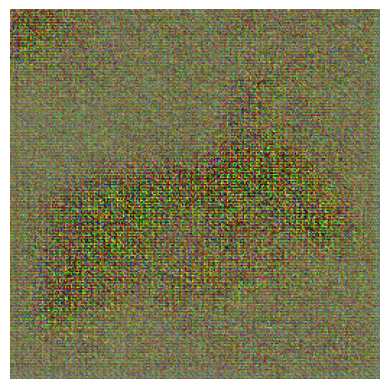

Displaying image: horse_0_500.png


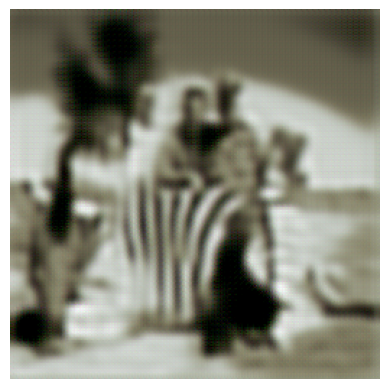

Displaying image: horse_1_0.png


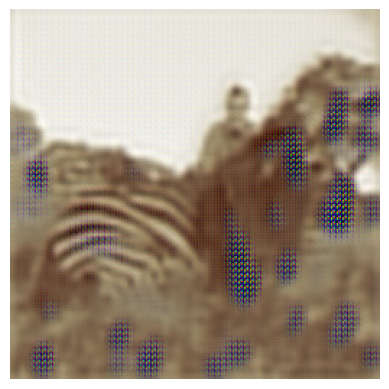

Displaying image: horse_0_1000.png


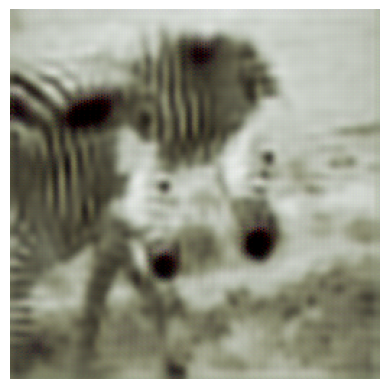

Displaying image: horse_1_500.png


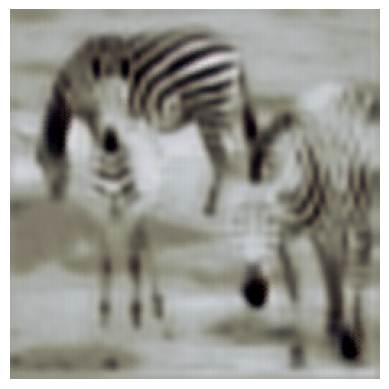

Displaying image: horse_1_1000.png


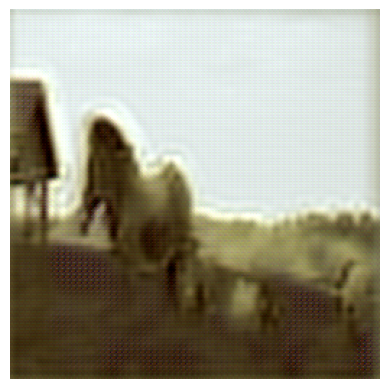

Outputting images in attention/zebra_gen:
Displaying image: zebra_1_0.png


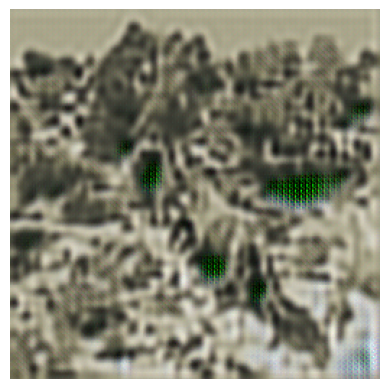

Displaying image: zebra_1_1000.png


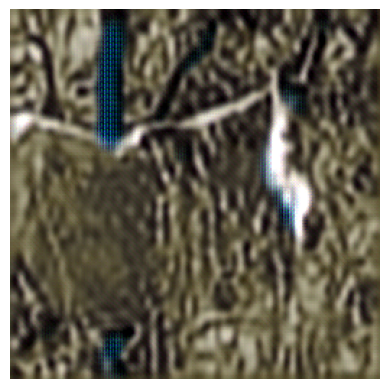

Displaying image: zebra_0_500.png


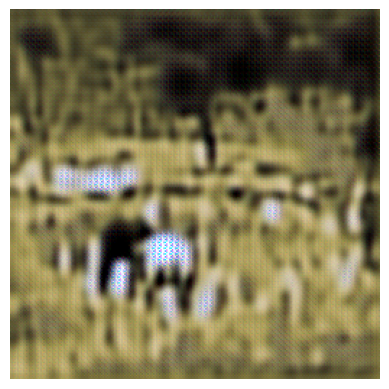

Displaying image: zebra_0_0.png


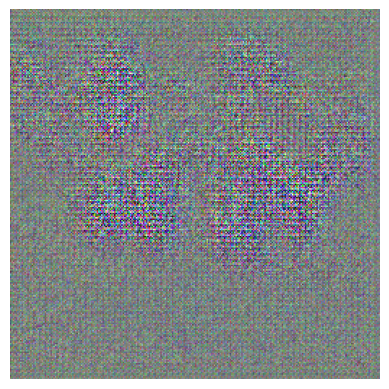

Displaying image: zebra_1_500.png


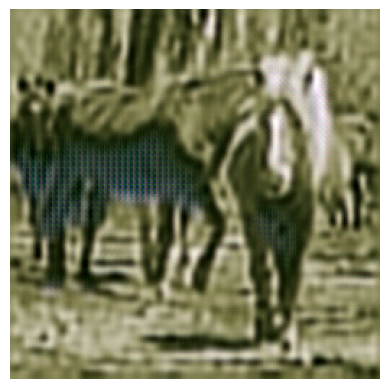

Displaying image: zebra_0_1000.png


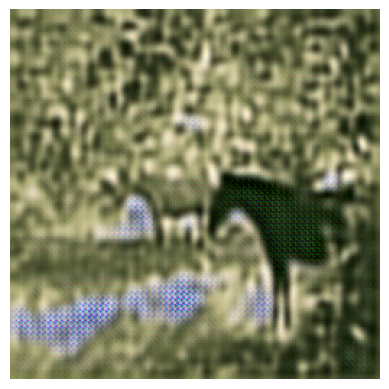

In [ ]:
import os
import matplotlib.pyplot as plt
from PIL import Image

def display_images(directory):
    print(f"Outputting images in {directory}:")
    files = os.listdir(directory)
    for file_name in files:
        file_path = os.path.join(directory, file_name)
        print(f"Displaying image: {file_name}")
        img = Image.open(file_path)
        plt.imshow(img)
        plt.axis('off')
        plt.show()

display_images("attention/horse_gen")
display_images("attention/zebra_gen")


#Question3

PGD enhances CycleGAN adversarial robustness by crafting potent adversarial examples during training and evaluation. It acts as regularization, exposing the model to adversarial perturbations to prevent overfitting and improve generalization. Integrating PGD into adversarial training strengthens the model against attacks, ensuring robustness to unseen data. This technique provides a principled approach to generate and evaluate adversarial examples, enhancing CycleGAN performance in adversarial scenarios.

In [ ]:
import torch
import torch.optim as optim
import torch.nn as nn
from tqdm import tqdm
import os

def pgd_attack(model, images, epsilon, alpha, num_iter):
    perturbed_images = images.clone().detach().requires_grad_(True)
    for _ in range(num_iter):
        outputs = model(perturbed_images)
        loss = nn.MSELoss()(outputs, torch.zeros_like(outputs))
        model.zero_grad()
        loss.backward(retain_graph=True)
        if perturbed_images.grad is not None:
            gradient = perturbed_images.grad.data
            perturbed_images = perturbed_images + alpha * torch.sign(gradient)

            perturbed_images = torch.max(torch.min(perturbed_images, images + epsilon), images - epsilon)
            perturbed_images = torch.clamp(perturbed_images, 0, 1)

    return perturbed_images.detach()




def train_fn(h_disc, z_disc, h_gen, z_gen, loader, opt_disc, opt_gen, l1,
             mse, d_scaler, g_scaler, output_dir, epsilon=0.01, alpha=0.01, num_iter=10):
    global save_count
    loop = tqdm(loader, leave=True)

    fake_horses = 0
    real_horses = 0

    for idx, (horse, zebra) in enumerate(loop):
        horse = horse.to(DEVICE)
        zebra = zebra.to(DEVICE)

        perturbed_real_horse = pgd_attack(h_disc, horse, epsilon, alpha, num_iter)
        perturbed_fake_horse = pgd_attack(h_disc, z_gen(zebra), epsilon, alpha, num_iter)

        perturbed_real_zebra = pgd_attack(z_disc, zebra, epsilon, alpha, num_iter)
        perturbed_fake_zebra = pgd_attack(z_disc, h_gen(horse), epsilon, alpha, num_iter)

        with torch.cuda.amp.autocast():
            real_horse_disc = h_disc(perturbed_real_horse)
            fake_horse_disc = h_disc(perturbed_fake_horse.detach())
            real_horses += real_horse_disc.mean().item()
            fake_horses += fake_horse_disc.mean().item()
            real_horse_disc_loss = mse(real_horse_disc, torch.ones_like(real_horse_disc))
            fake_horse_disc_loss = mse(fake_horse_disc, torch.zeros_like(fake_horse_disc))
            horse_disc_loss = real_horse_disc_loss + fake_horse_disc_loss

            real_zebra_disc = z_disc(perturbed_real_zebra)
            fake_zebra_disc = z_disc(perturbed_fake_zebra.detach())
            real_zebra_disc_loss = mse(real_zebra_disc, torch.ones_like(real_zebra_disc))
            fake_zebra_disc_loss = mse(fake_zebra_disc, torch.zeros_like(fake_zebra_disc))
            zebra_disc_loss = real_zebra_disc_loss + fake_zebra_disc_loss

            disc_loss = (zebra_disc_loss + horse_disc_loss) / 2

        opt_disc.zero_grad()
        d_scaler.scale(disc_loss).backward()
        d_scaler.step(opt_disc)
        d_scaler.update()

        with torch.cuda.amp.autocast():
            fake_horse_gen = h_gen(zebra)
            fake_zebra_gen = z_gen(horse)

            fake_horse_disc = h_disc(fake_horse_gen)
            fake_zebra_disc = z_disc(fake_zebra_gen)

            horse_gen_loss = mse(fake_horse_disc, torch.ones_like(fake_horse_disc))
            zebra_gen_loss = mse(fake_zebra_disc, torch.ones_like(fake_zebra_disc))

            gen_loss = (
                horse_gen_loss + zebra_gen_loss
                + (l1(zebra, z_gen(fake_horse_gen)) * 10)
                + (l1(horse, h_gen(fake_zebra_gen)) * 10)
            )

        opt_gen.zero_grad()
        g_scaler.scale(gen_loss).backward()
        g_scaler.step(opt_gen)
        g_scaler.update()

        if idx % 500 == 0:
            horse_dir = os.path.join(output_dir, "horse_gen")
            zebra_dir = os.path.join(output_dir, "zebra_gen")
            os.makedirs(horse_dir, exist_ok=True)
            os.makedirs(zebra_dir, exist_ok=True)
            save_image(fake_horse_gen * 0.5 + 0.5, f"{horse_dir}/horse_{epoch}_{idx}.png")
            save_image(fake_zebra_gen * 0.5 + 0.5, f"{zebra_dir}/zebra_{epoch}_{idx}.png")

        loop.set_postfix(real_horse=real_horses / (idx + 1), fake_horse=fake_horses / (idx + 1))

output_dir = "output_images1"
for epoch in range(2):
    train_fn(h_disc, z_disc, z_gen, h_gen, loader, opt_disc, opt_gen, L1, mse, d_scaler, g_scaler, output_dir)


  0%|          | 0/1334 [00:00<?, ?it/s]<ipython-input-36-2e150cd34372>:27: UserWarning: The .grad attribute of a Tensor that is not a leaf Tensor is being accessed. Its .grad attribute won't be populated during autograd.backward(). If you indeed want the .grad field to be populated for a non-leaf Tensor, use .retain_grad() on the non-leaf Tensor. If you access the non-leaf Tensor by mistake, make sure you access the leaf Tensor instead. See github.com/pytorch/pytorch/pull/30531 for more informations. (Triggered internally at aten/src/ATen/core/TensorBody.h:489.)
  if perturbed_images.grad is not None:
 68%|██████▊   | 908/1334 [12:39<05:53,  1.21it/s, fake_horse=1, real_horse=1]

Output of Robust GAN(PGD)

Outputting images in output_images1/horse_gen:
Displaying image: horse_0_0.png


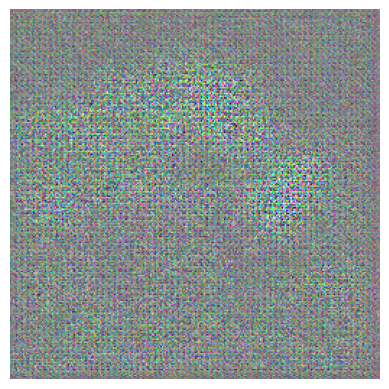

Displaying image: horse_0_500.png


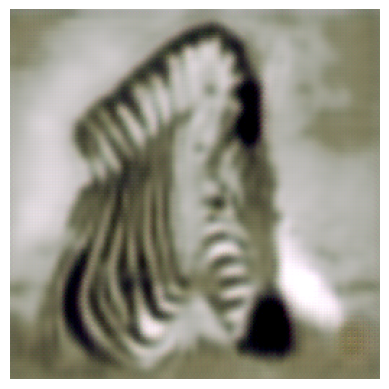

Displaying image: horse_0_1000.png


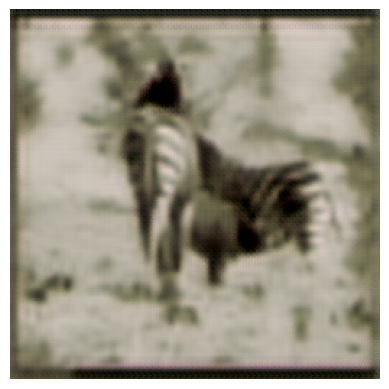

Outputting images in output_images1/zebra_gen:
Displaying image: zebra_0_500.png


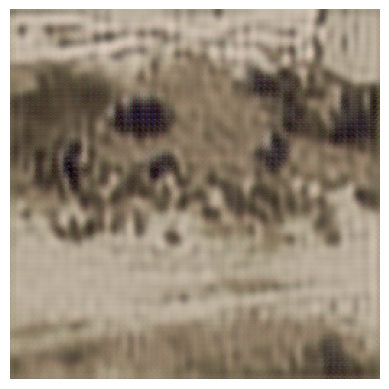

Displaying image: zebra_0_0.png


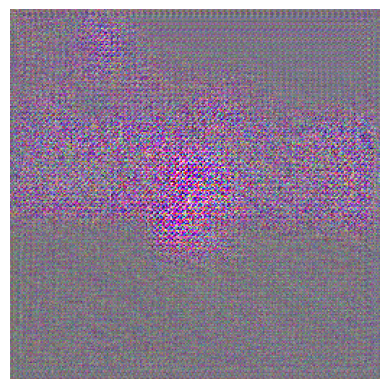

Displaying image: zebra_0_1000.png


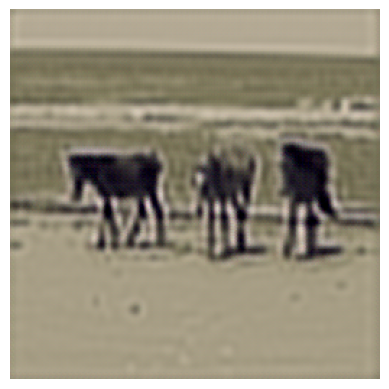

In [ ]:
import os
import matplotlib.pyplot as plt
from PIL import Image

def display_images(directory):
    print(f"Outputting images in {directory}:")
    files = os.listdir(directory)
    for file_name in files:
        file_path = os.path.join(directory, file_name)
        print(f"Displaying image: {file_name}")
        img = Image.open(file_path)
        plt.imshow(img)
        plt.axis('off')
        plt.show()

display_images("output_images1/horse_gen")
display_images("output_images1/zebra_gen")


## Discuss the implications of adversarial robustness in real-world deployment scenarios and potential applications in security-sensitive domains.

Adversarial robustness is critical for real-world deployment, particularly in security-sensitive domains like finance and healthcare. These domains handle sensitive data where even slight model vulnerabilities could lead to significant consequences such as financial fraud or misdiagnosis. By enhancing adversarial robustness, we mitigate the risk of attacks that aim to manipulate model outputs, ensuring reliable and trustworthy decision-making. This fortification helps maintain the integrity and confidentiality of user information, bolstering trust in AI systems. Moreover, in security-sensitive applications, robust models can effectively counteract adversarial threats, safeguarding critical data and infrastructure from exploitation and breaches.

#Question2

In [ ]:
class HorseDataset(Dataset):
    def __init__(self, metadata_file, root_dir, domain, transform=None):
        self.transform = transform
        self.data = []

        metadata = pd.read_csv(metadata_file)
        metadata = metadata[metadata['domain'].str.contains(domain)]
        metadata = metadata[metadata['split'] == 'train']
        metadata = metadata[metadata['image_path'].str.contains(root_dir)]

        for index, row in metadata.iterrows():
            image_path = row['image_path']
            if os.path.exists(image_path):
                self.data.append((image_path, row['domain'].split()[1]))

    def __len__(self):
        return len(self.data)

    def __getitem__(self, index):
        image_path, class_label = self.data[index]
        image = np.array(Image.open(image_path).convert("RGB"))

        if self.transform:
            image = self.transform(image=image)["image"]

        return image, class_label



horse_dataset = HorseDataset(
    metadata_file="/content/metadata.csv",
    root_dir="trainA",
    domain="A",
    transform=transforms,
)

zebra_dataset = HorseDataset(
    metadata_file="/content/metadata.csv",
    root_dir="trainB",
    domain="B",
    transform=transforms,
)

horse_loader = DataLoader(
    horse_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=4,
    pin_memory=True,
)

zebra_loader = DataLoader(
    zebra_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=4,
    pin_memory=True,
)


Horse Dataset:
Image shape: torch.Size([256, 256, 3])


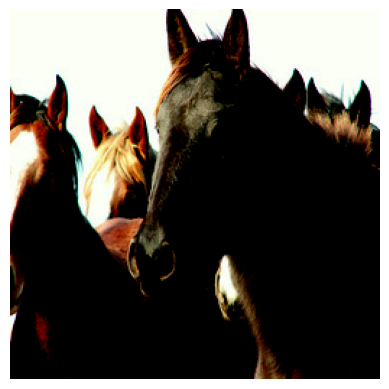

Class label: (Horse)

Image shape: torch.Size([256, 256, 3])


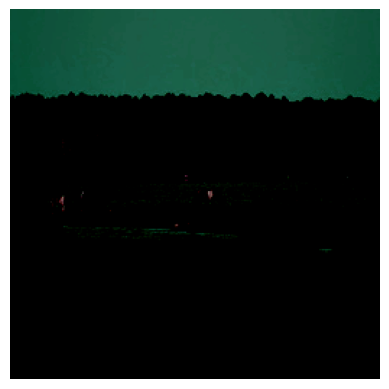

Class label: (Horse)

Image shape: torch.Size([256, 256, 3])


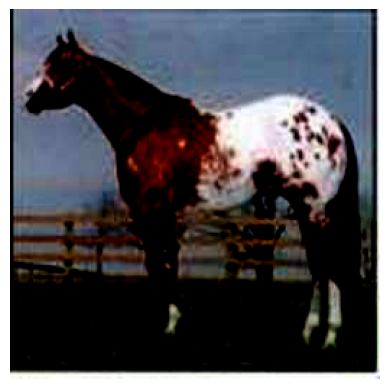

Class label: (Horse)

Image shape: torch.Size([256, 256, 3])


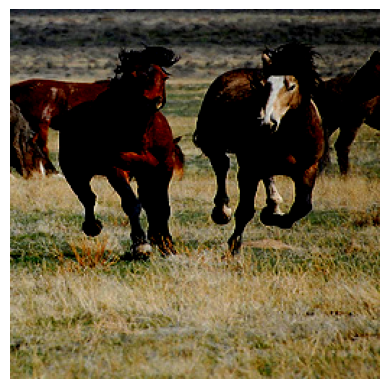

Class label: (Horse)

Image shape: torch.Size([256, 256, 3])


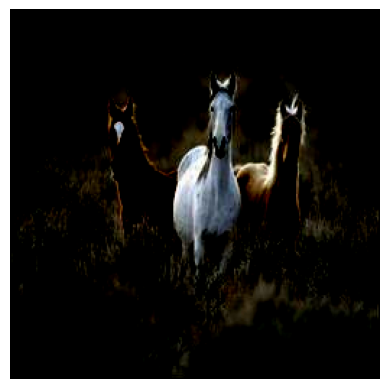

Class label: (Horse)

Zebra Dataset:


Image shape: torch.Size([256, 256, 3])


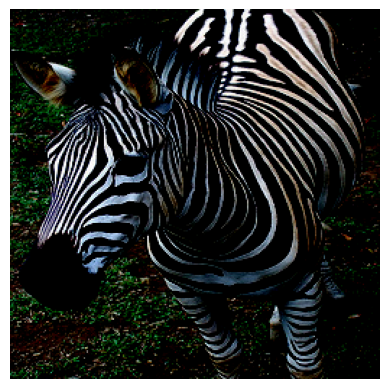

Class label: (Zebra)

Image shape: torch.Size([256, 256, 3])


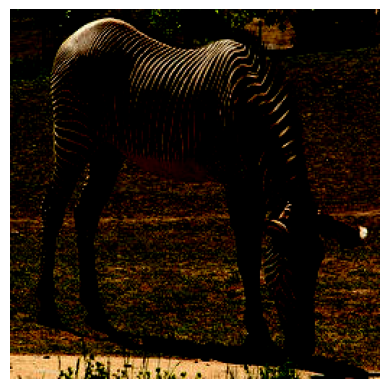

Class label: (Zebra)

Image shape: torch.Size([256, 256, 3])


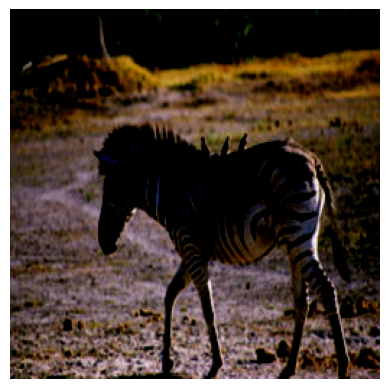

Class label: (Zebra)

Image shape: torch.Size([256, 256, 3])


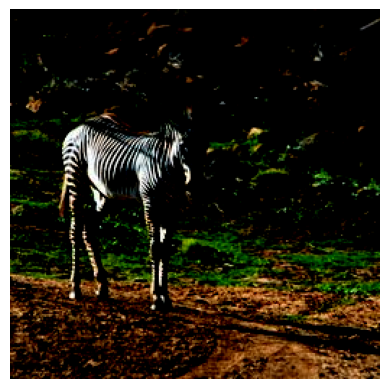

Class label: (Zebra)



Image shape: torch.Size([256, 256, 3])


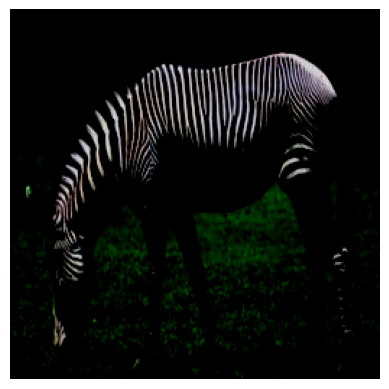

Class label: (Zebra)



In [ ]:
import numpy as np
import matplotlib.pyplot as plt

print("Horse Dataset:")
for i in range(min(5, len(horse_dataset))):
    image, class_label = horse_dataset[i]
    image = np.transpose(image, (1, 2, 0))
    print("Image shape:", image.shape)
    plt.imshow(image)
    plt.axis('off')
    plt.show()
    print("Class label:", class_label)
    print()

print("Zebra Dataset:")
for i in range(min(5, len(zebra_dataset))):
    image, class_label = zebra_dataset[i]
    image = np.transpose(image, (1, 2, 0))
    print("Image shape:", image.shape)
    plt.imshow(image)
    plt.axis('off')
    plt.show()
    print("Class label:", class_label)
    print()



In [ ]:
num_horse_instances = len(horse_dataset)
print("Number of instances in the horse dataset:", num_horse_instances)

num_zebra_instances = len(zebra_dataset)
print("Number of instances in the zebra dataset:", num_zebra_instances)


Number of instances in the horse dataset: 1067
Number of instances in the zebra dataset: 1214


Modified Discriminator

In [ ]:
import torch.nn as nn

class Discriminator(nn.Module):
    def __init__(self, input_nc=3, ndf=64, norm_layer=nn.BatchNorm2d, num_classes=2):
        super(Discriminator, self).__init__()
        self.conv_tower = nn.Sequential(
            nn.Conv2d(input_nc, ndf, kernel_size=4, stride=2, padding=1),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf, ndf * 2, kernel_size=4, stride=2, padding=1),
            norm_layer(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 2, ndf * 4, kernel_size=4, stride=2, padding=1),
            norm_layer(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(ndf * 4, ndf * 8, kernel_size=4, stride=2, padding=1),
            norm_layer(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
        )

        #For Classification
        self.adv_classifier = nn.Conv2d(ndf * 8, 1, kernel_size=4, stride=1, padding=0)
        self.aux_classifier = nn.Conv2d(ndf * 8, num_classes, kernel_size=4, stride=1, padding=0)
        self.sigmoid = nn.Sigmoid()
        self.softmax = nn.Softmax(dim=1)

    def forward(self, img):
        features = self.conv_tower(img)
        adv_output = self.sigmoid(self.adv_classifier(features)).view(-1, 1)
        aux_output = self.softmax(self.aux_classifier(features)).view(-1, self.num_classes)
        return adv_output, aux_output
